In [1]:
import cv2
import matplotlib.pyplot as plt
import numpy as np 
import math

In [35]:
im1 = cv2.imread('left.jpg')
im1color = cv2.cvtColor(im1,cv2.COLOR_BGR2RGB)
img1 = cv2.cvtColor(im1,cv2.COLOR_BGR2GRAY)
im2 = cv2.imread('right.jpg')
im2color = cv2.cvtColor(im2,cv2.COLOR_BGR2RGB)
img2 = cv2.cvtColor(im2,cv2.COLOR_BGR2GRAY)

# Exercise 10.1

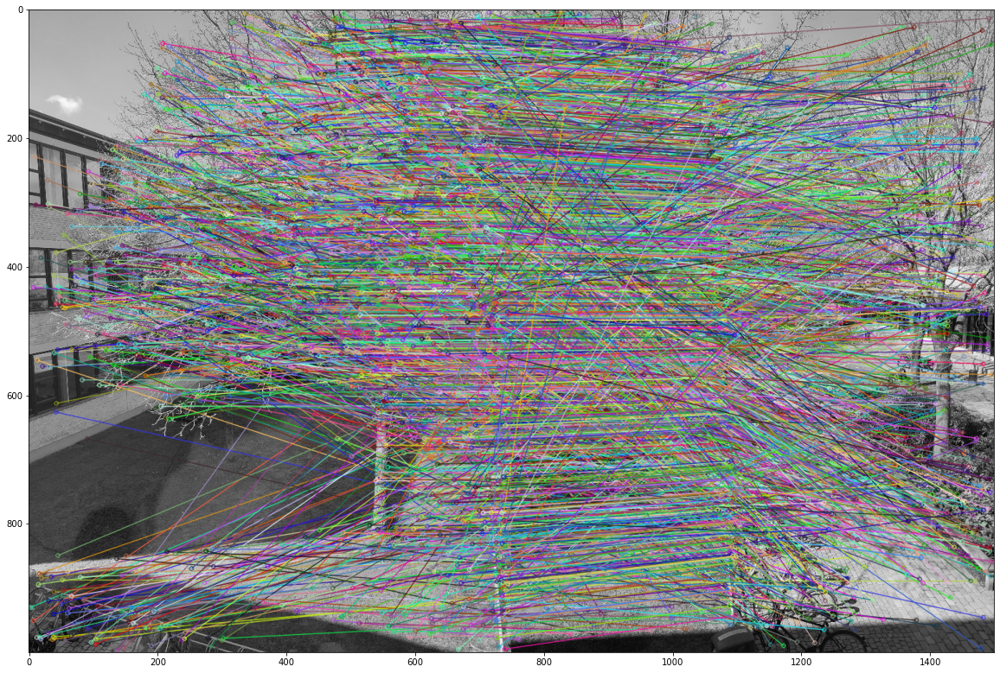

In [16]:
sift = cv2.SIFT_create()
kp1, des1 = sift.detectAndCompute(img1, None)##key points and description
kp2, des2 = sift.detectAndCompute(img2, None)
bf = cv2.BFMatcher(crossCheck=True)
matches = bf.match(des1, des2)
outimg = cv2.drawMatches(img1, kp1, img2, kp2, matches,None,flags = 2)
plt.figure(figsize=(20,20))
plt.imshow(outimg)

# Exercise 10.2

In [6]:
def normalize2D(pi):
    #pih = np.vstack((pi, np.ones(len(pi[0]))))
    m = np.mean(pi,1)
    stdd = np.std(pi,1)
    T = np.diag([1/stdd[0],1/stdd[1],1])
    T[0][2]=-m[0]/stdd[0]
    T[1][2]=-m[1]/stdd[1]
    qi = T@pi
    return qi,T

def CrossOp(p):
    px = np.array([  [0,-p[2],p[1]],[p[2],0,-p[0]],[-p[1],p[0],0]   ])
    return px

def hest(q1,q2):    
    #q1 equals the mapping point q, q2 equals the origin point Q
    #q1,q2 should be inhomogenious coordinates
#    q1 = np.vstack((q1, np.ones(len(q1[0]))))
#    q2 = np.vstack((q2, np.ones(len(q2[0]))))
    q1,T1 = normalize2D(q1)
    q2,T2 = normalize2D(q2)
    B = np.kron(q2[:,0],CrossOp(q1[:,0]))
    for i in range(1,len(q1[0])):
        B_temp = np.kron(q2[:,i],CrossOp(q1[:,i]))
        B = np.vstack((B,B_temp))
    u, s, vh = np.linalg.svd(B.T@B)
    H = np.reshape(vh[-1],(3,3)) 
    H = np.linalg.inv(T1)@H.T@T2
#    H = H.round(2)    
    return H

def PI(q):
    return q[:-1]/q[-1]

In [7]:
def distance(H,p1,p2):

    d1 = PI(p1)-PI(H@p2)
    d2 = PI(p2)-PI(np.linalg.inv(H)@p1)
    dist = np.linalg.norm(d1)**2+np.linalg.norm(d2)**2
    
    return dist

def consensus(H,p1,p2):

    number = 0
    inliers_index = []
    for i in range(len(p1[0])):
        p1i =p1[:,i] 
        p2i = p2[:,i]
        dist = distance(H,p1i,p2i)
        if dist<3.84*(3**2):
            number = number+1
            inliers_index.append(i)
    return number,np.asarray(inliers_index)

In [8]:
def RANSAC_H(match1ch,match2ch,iterations):
    maxnumber = 0   
#    best_inliers_index =[]
    for i in range(iterations):
        index = np.random.choice(len(match1ch[0]),4,replace=False)
        p1 = match1ch[:,index]
        p2 = match2ch[:,index]
        Hest = hest(p1,p2)       
        number,inliers_index = consensus(Hest,match1ch,match2ch)
        if number>maxnumber:
            maxnumber = number
#            best_inliers_index = inliers_index
            Hbest = Hest
            print("the %d is the best estimation, the max number is %d"%(i,maxnumber))
    
    
    _,inliers_index = consensus(Hbest,match1ch,match2ch)
    Hfinal = hest(match1ch[:,inliers_index],match2ch[:,inliers_index])
    return Hbest,inliers_index

In [20]:
#get match points coordinates
def getmatch(matches,kp1,kp2):
    match1c = []
    match2c = []
    for match in matches:
        match1 = kp1[match.queryIdx].pt
        match2 = kp2[match.trainIdx].pt

        match1c.append(match1)
        match2c.append(match2)

    match1c = np.asarray(match1c).T
    match2c = np.asarray(match2c).T

    #Homogeneous coordinates
    match1ch = np.vstack((match1c,np.ones(len(match1c[0]))))
    match2ch = np.vstack((match2c,np.ones(len(match1c[0]))))
    
    return match1ch,match2ch


In [18]:
Hest,inliers_index = RANSAC_H(match1ch,match2ch,200)

the 0 is the best estimation, the max number is 9
the 3 is the best estimation, the max number is 13
the 8 is the best estimation, the max number is 36
the 89 is the best estimation, the max number is 910


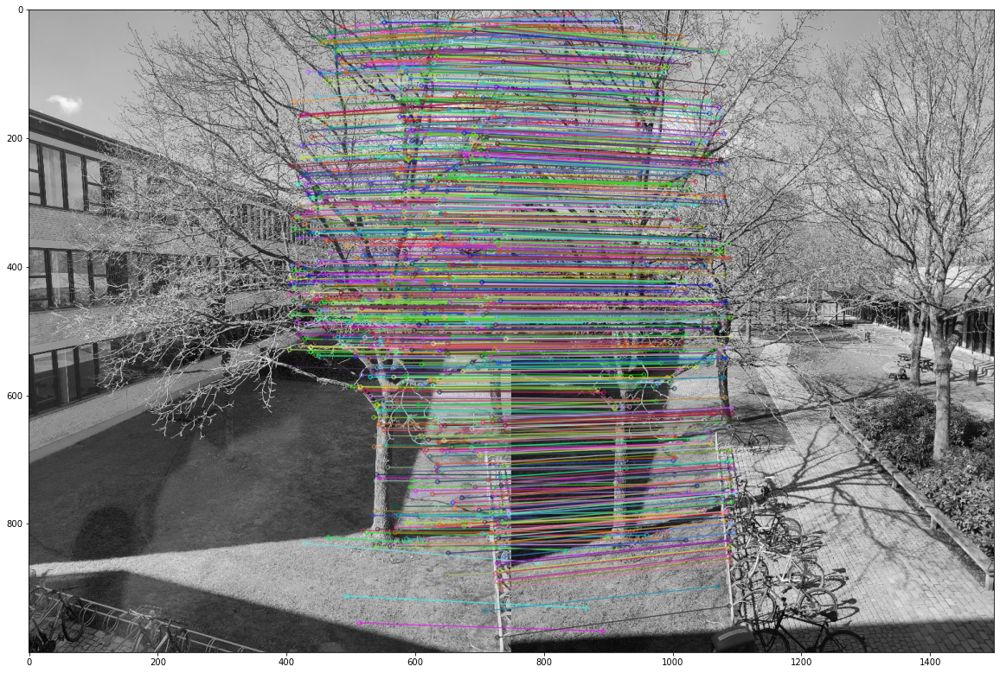

In [19]:
outimg = cv2.drawMatches(img1, kp1, img2, kp2, np.array(matches)[inliers_index],None,flags = 2)
plt.figure(figsize=(20,20))
plt.imshow(outimg)

# Exercise 10.3

In [21]:
def estHomographyRANSAC(kp1,des1,kp2,des2):
    bf = cv2.BFMatcher(crossCheck=True)
    matches = bf.match(des1, des2)
    
    match1ch,match2ch = getmatch(matches,kp1,kp2)
    Hbest,_= RANSAC_H(match1ch,match2ch,200)
    
    return Hbest


In [22]:
Hbest = estHomographyRANSAC(kp1,des1,kp2,des2)

the 0 is the best estimation, the max number is 4
the 1 is the best estimation, the max number is 5
the 14 is the best estimation, the max number is 603
the 176 is the best estimation, the max number is 869
the 198 is the best estimation, the max number is 928


# Exercise 10.4

In [24]:
def warpImage(im, H, xRange, yRange):
    T = np.eye(3)
    T[:2, 2] = [-xRange[0], -yRange[0]]
    H = T@H
    outSize = (xRange[1]-xRange[0], yRange[1]-yRange[0])
    imWarp = cv2.warpPerspective(im, H, outSize)
    maskWarp = cv2.warpPerspective(np.ones(im.shape[:2], dtype=np.uint8), H, outSize)
    return imWarp, maskWarp

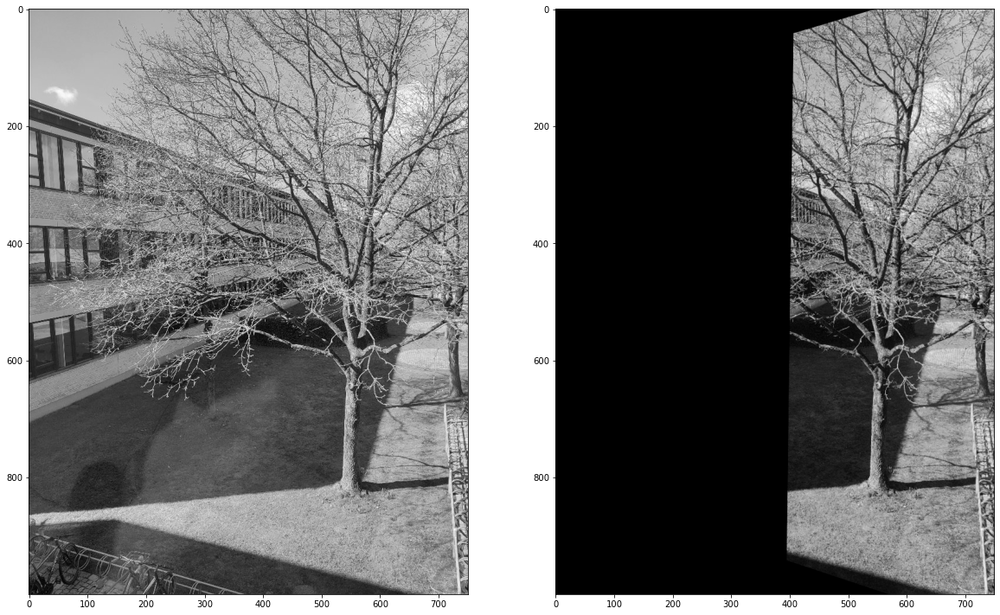

In [34]:
xRange = [0,im1.shape[1]]
yRange = [0, im1.shape[0]]

left_warp, left_mask = warpImage(img1, np.identity(3), xRange, yRange)
right_warp, right_mask = warpImage(img2, Hbest, xRange, yRange)

plt.figure(figsize=(20,20))
plt.subplot(1,2,1)
plt.imshow(left_warp,cmap="gray")
plt.subplot(1,2,2)
plt.imshow(right_warp,cmap="gray")

# Exercise 10.5

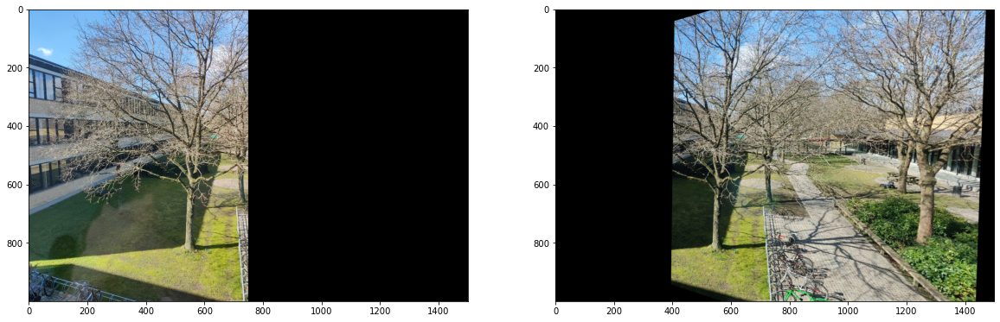

In [36]:
xRange = [0,1500]
yRange = [0, im1.shape[0]]

left_warp, left_mask = warpImage(im1color, np.identity(3), xRange, yRange)
right_warp, right_mask = warpImage(im2color, Hbest, xRange, yRange)

plt.figure(figsize=(20,20))
plt.subplot(1,2,1)
plt.imshow(left_warp)
plt.subplot(1,2,2)
plt.imshow(right_warp)

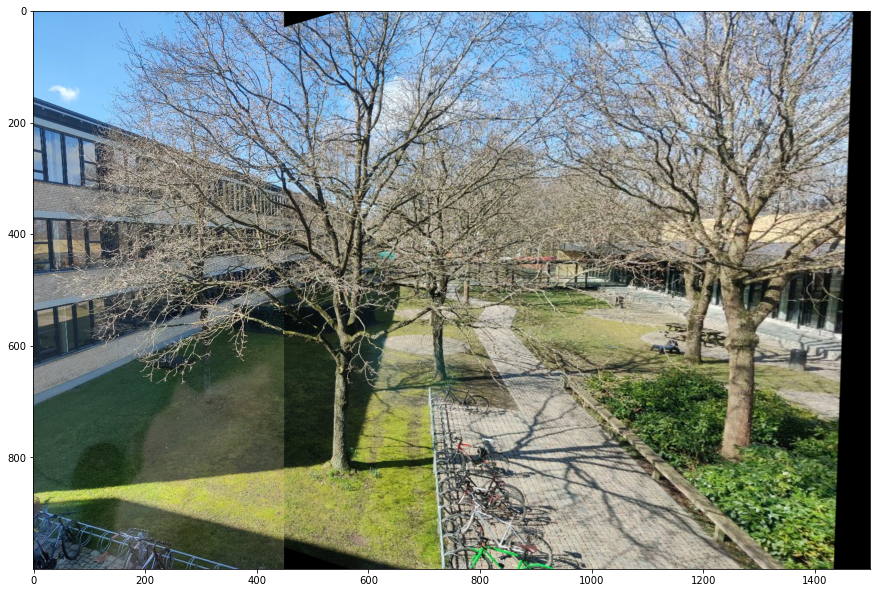

In [42]:
combine = right_warp.copy()
combine[:, 0:450] = left_warp[:, 0:450]
plt.figure(figsize=(15,15))
plt.imshow(combine)

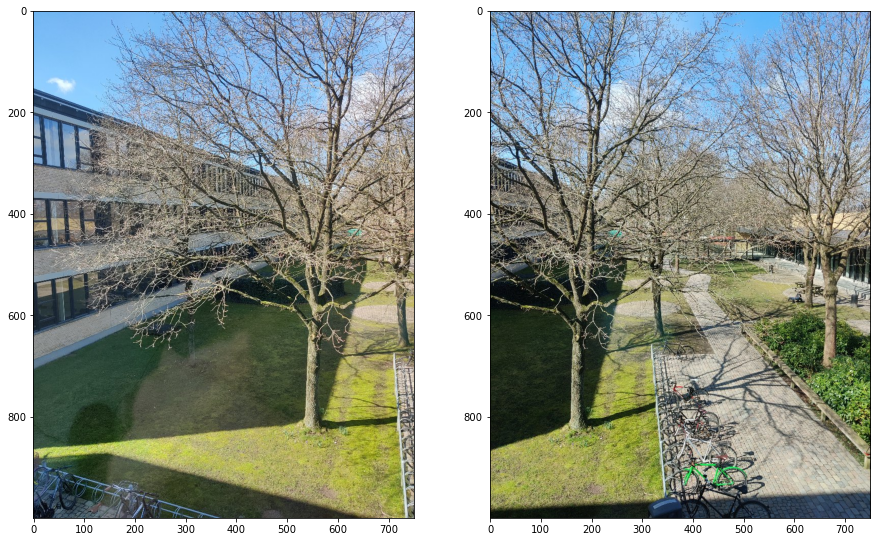

In [40]:
plt.figure(figsize=(15,15))
plt.subplot(1,2,1)
plt.imshow(im1color)
plt.subplot(1,2,2)
plt.imshow(im2color)

## TRY

In [46]:
im1 = cv2.imread('TESTL1.jpg')
im1color = cv2.cvtColor(im1,cv2.COLOR_BGR2RGB)
img1 = cv2.cvtColor(im1,cv2.COLOR_BGR2GRAY)
im2 = cv2.imread('TESTR2.jpg')
im2color = cv2.cvtColor(im2,cv2.COLOR_BGR2RGB)
img2 = cv2.cvtColor(im2,cv2.COLOR_BGR2GRAY)

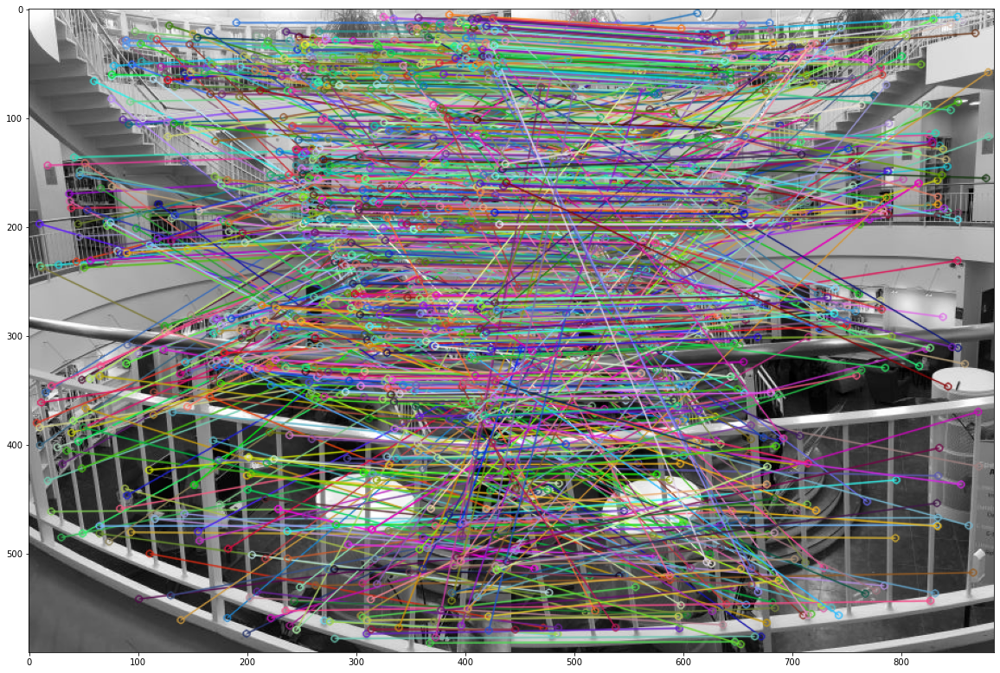

In [47]:
sift = cv2.SIFT_create()
kp1, des1 = sift.detectAndCompute(img1, None)##key points and description
kp2, des2 = sift.detectAndCompute(img2, None)
bf = cv2.BFMatcher(crossCheck=True)
matches = bf.match(des1, des2)
outimg = cv2.drawMatches(img1, kp1, img2, kp2, matches,None,flags = 2)
plt.figure(figsize=(20,20))
plt.imshow(outimg)

In [48]:
Hbest = estHomographyRANSAC(kp1,des1,kp2,des2)

the 0 is the best estimation, the max number is 6
the 4 is the best estimation, the max number is 58
the 19 is the best estimation, the max number is 169
the 78 is the best estimation, the max number is 170
the 122 is the best estimation, the max number is 211
the 131 is the best estimation, the max number is 384


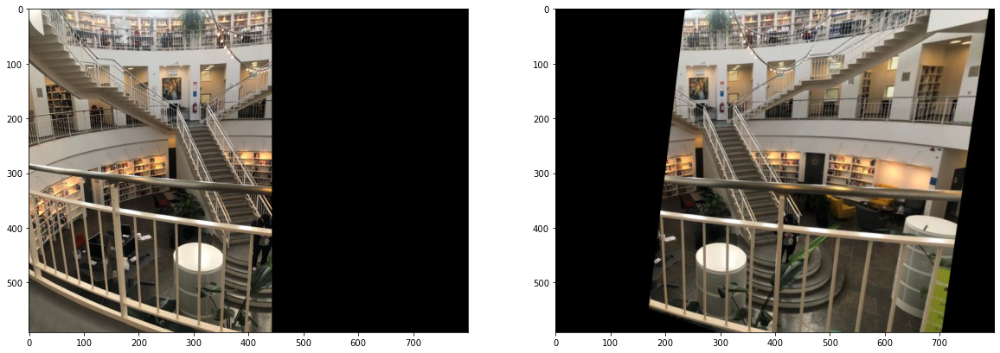

In [53]:
xRange = [0,800]
yRange = [0, im1.shape[0]]

left_warp, left_mask = warpImage(im1color, np.identity(3), xRange, yRange)
right_warp, right_mask = warpImage(im2color, Hbest, xRange, yRange)

plt.figure(figsize=(20,20))
plt.subplot(1,2,1)
plt.imshow(left_warp)
plt.subplot(1,2,2)
plt.imshow(right_warp)

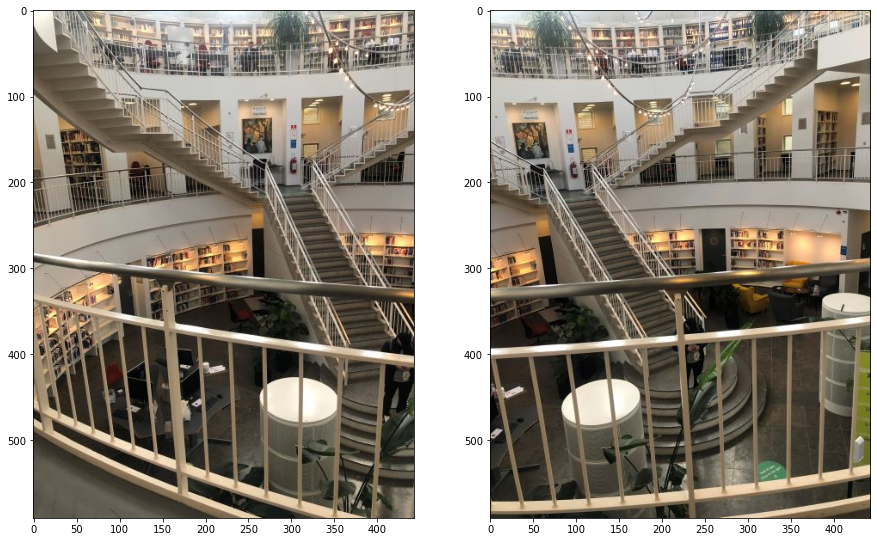

In [57]:
plt.figure(figsize=(15,15))
plt.subplot(1,2,1)
plt.imshow(im1color)
plt.subplot(1,2,2)
plt.imshow(im2color)

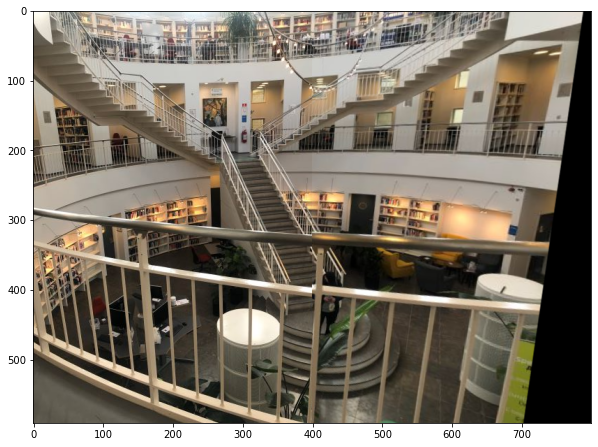

In [58]:
combine = right_warp.copy()
combine[:, 0:400] = left_warp[:, 0:400]
plt.figure(figsize=(10,10))
plt.imshow(combine)